# Basic EDA on Super store data set

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_excel("C:/Users/Lenovo/Desktop/Superstore_USA.xlsx")

In [3]:
df.head(6)

,Row ID,Order Priority,Discount,Unit Price,Shipping Cost,Customer ID,Customer Name,Ship Mode,Customer Segment,Product Category,...,Region,State or Province,City,Postal Code,Order Date,Ship Date,Profit,Quantity ordered new,Sales,Order ID
0,18606,Not Specified,0.01,2.88,0.50,2,Janice Fletcher,Regular Air,Corporate,Office Supplies,...,Central,Illinois,Addison,60101,2012-05-28,2012-05-30,1.3200,2,5.90,88525
1,20847,High,0.01,2.84,0.93,3,Bonnie Potter,Express Air,Corporate,Office Supplies,...,West,Washington,Anacortes,98221,2010-07-07,2010-07-08,4.5600,4,13.01,88522
2,23086,Not Specified,0.03,6.68,6.15,3,Bonnie Potter,Express Air,Corporate,Office Supplies,...,West,Washington,Anacortes,98221,2011-07-27,2011-07-28,-47.6400,7,49.92,88523
3,23087,Not Specified,0.01,5.68,3.60,3,Bonnie Potter,Regular Air,Corporate,Office Supplies,...,West,Washington,Anacortes,98221,2011-07-27,2011-07-28,-30.5100,7,41.64,88523
4,23088,Not Specified,0.00,205.99,2.50,3,Bonnie Potter,Express Air,Corporate,Technology,...,West,Washington,Anacortes,98221,2011-07-27,2011-07-27,998.2023,8,1446.67,88523
5,23597,Medium,0.09,55.48,14.30,3,Bonnie Potter,Express Air,Corporate,Office Supplies,...,West,Washington,Anacortes,98221,2011-11-09,2011-11-11,1388.0523,37,2011.67,88524


In [5]:
import pandas_profiling

In [6]:
df.profile_report()

In [8]:
df['Product Category'].unique()

array(['Office Supplies', 'Technology', 'Furniture'], dtype=object)

In [10]:
#number of products we have for each category 
df['Product Category'].value_counts()

Office Supplies    5181
Technology         2312
Furniture          1933
Name: Product Category, dtype: int64

In [11]:
df.columns

Index(['Row ID', 'Order Priority', 'Discount', 'Unit Price', 'Shipping Cost',
       'Customer ID', 'Customer Name', 'Ship Mode', 'Customer Segment',
       'Product Category', 'Product Sub-Category', 'Product Container',
       'Product Name', 'Product Base Margin', 'Region', 'State or Province',
       'City', 'Postal Code', 'Order Date', 'Ship Date', 'Profit',
       'Quantity ordered new', 'Sales', 'Order ID'],
      dtype='object')

In [13]:
df['year'] = pd.DatetimeIndex(df['Order Date']).year

In [12]:
df['Product Sub-Category'].unique()

array(['Labels', 'Pens & Art Supplies', 'Paper',
       'Scissors, Rulers and Trimmers', 'Telephones and Communication',
       'Office Machines', 'Chairs & Chairmats', 'Appliances', 'Bookcases',
       'Tables', 'Envelopes', 'Office Furnishings', 'Rubber Bands',
       'Binders and Binder Accessories', 'Storage & Organization',
       'Computer Peripherals', 'Copiers and Fax'], dtype=object)

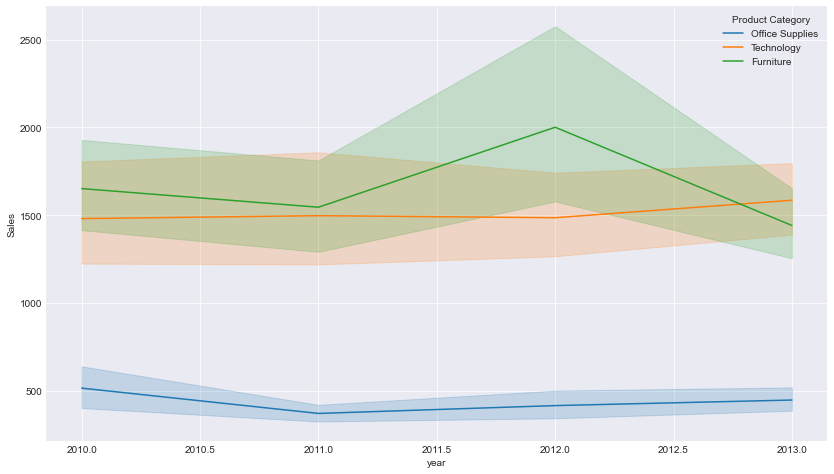

In [22]:
plt.figure(figsize=(14,8))
plt.style.use('seaborn-darkgrid')
sns.lineplot(x="year" , y="Sales" , hue="Product Category" , data=df)
plt.show()

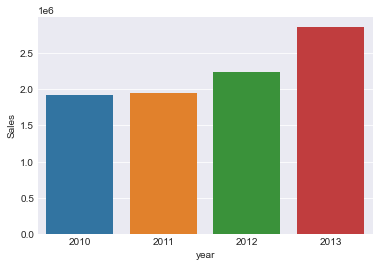

In [34]:
ax = sns.barplot(x="year", y=df["Sales"].groupby(df['year']).sum(), data=df)

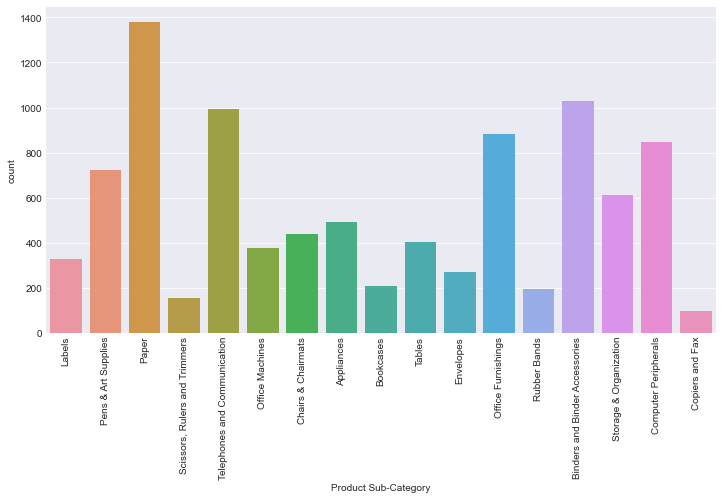

In [54]:
plt.figure(figsize=(12,6))
sns.countplot(x=df['Product Sub-Category'])
plt.xticks(rotation=90)
plt.show()

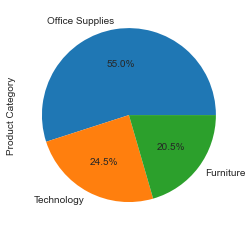

In [83]:
df['Product Category'].value_counts().plot.pie(autopct="%1.1f%%")
plt.show()

In [89]:
# Top 10 customers
df_top10=df['Customer Name'].value_counts().head(10)
df_top10

Louis Parrish            27
Jenny Gold               26
Sean N Boyer             22
Leigh Burnette Hurley    22
Glen Caldwell            21
Andrew Gonzalez          21
Andrew Levine            20
Eleanor Swain            19
Priscilla Kane           19
Pam Patton               18
Name: Customer Name, dtype: int64

In [90]:
df_topprod=df['Product Name'].value_counts().head(10)
df_topprod

Global High-Back Leather Tilter, Burgundy                                                    27
Bevis 36 x 72 Conference Tables                                                              26
Master Giant Foot® Doorstop, Safety Yellow                                                   24
BoxOffice By Design Rectangular and Half-Moon Meeting Room Tables                            24
Wilson Jones Hanging View Binder, White, 1"                                                  23
StarTAC 7760                                                                                 22
Peel & Seel® Recycled Catalog Envelopes, Brown                                               22
Office Star - Mid Back Dual function Ergonomic High Back Chair with 2-Way Adjustable Arms    22
Fiskars® Softgrip Scissors                                                                   22
80 Minute CD-R Spindle, 100/Pack - Staples                                                   22
Name: Product Name, dtype: int64